<h1 align="center">Analysis of users (Player's data)</h1>

<h1 align="center">Identifying cheaters through of Behaviour analysis in Machine learning Models</h1>

# Table of Content
1. Load data
1. Data Cleaning and Feature Engineering
    * Schema settings
    * Check data
    * Delete abnormal data
    * Check null value
1. Feature Selection
1. Anomaly Detection with Exploratory Data Analysis(EDA)
1. Anomaly Detection with Machine Learning
1. PCA to speed-up ML algorithms
1. One-Class SVM
1. Isolation Forest
1. Cross Validating the models

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [ ]:
train = pd.read_csv('./data/train_V2.csv')

In [ ]:
pd.options.display.max_columns = None
train.head()

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,1241,0,0,0.00,1306,squad-fpp,28,26,-1,0,0.0000,0,0.00,0,0,244.80,1,1466,0.4444
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,0,0,0,0.00,1777,squad-fpp,26,25,1484,0,0.0045,0,11.04,0,0,1434.00,5,0,0.6400
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,0,0,0,0.00,1318,duo,50,47,1491,0,0.0000,0,0.00,0,0,161.80,2,0,0.7755
3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,0,0,32.90,0,0,0,75,0,0,0,0.00,1436,squad-fpp,31,30,1408,0,0.0000,0,0.00,0,0,202.70,3,0,0.1667
4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,0,0,100.00,0,0,0,45,0,1,1,58.53,1424,solo-fpp,97,95,1560,0,0.0000,0,0.00,0,0,49.75,2,0,0.1875


In [ ]:
train.groupby('matchType').size()

matchType
crashfpp               6287
crashtpp                371
duo                  313591
duo-fpp              996691
flarefpp                718
flaretpp               2505
normal-duo              199
normal-duo-fpp         5489
normal-solo             326
normal-solo-fpp        1682
normal-squad            516
normal-squad-fpp      17174
solo                 181943
solo-fpp             536762
squad                626526
squad-fpp           1756186
dtype: int64

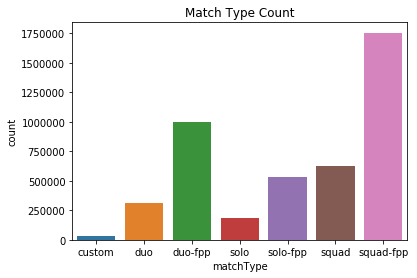

In [ ]:
data = train.copy()
data.loc[~data['matchType'].isin(['solo','duo','squad','solo-fpp','duo-fpp','squad-fpp'])] = 'custom'
sns.countplot(data['matchType'].sort_values())
plt.title("Match Type Count")
plt.show()

In [ ]:
train.groupby('matchType').mean()

,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
matchType,,,,,,,,,,,,,,,,,,,,,,,,,
crashfpp,0.191824,1.131223,90.026153,0.452839,0.075553,1.207253,44.945920,0.000000,0.779068,0.516781,4.470438,892.842691,46.963417,44.183394,1500.000000,0.058374,1890.569417,0.312868,1.543515,0.073167,0.078098,669.118930,1.518530,0.000000,0.474711
crashtpp,0.242588,1.105121,101.932507,0.479784,0.056604,0.940701,38.417790,0.000000,0.881402,0.576819,5.540457,897.873315,38.862534,36.822102,1500.000000,0.029650,1302.812062,0.366577,0.294717,0.037736,0.067385,724.213005,1.665768,0.000000,0.484515
duo,0.213676,1.133486,126.321987,0.610553,0.212576,1.338989,47.408660,443.144156,0.907966,0.545258,22.210025,1646.611606,47.684768,45.575386,924.626970,0.151879,752.369869,0.004260,4.811171,0.026187,0.010431,1123.632484,3.719144,578.095701,0.482777
duo-fpp,0.215806,1.078022,132.249549,0.628594,0.225009,1.328823,47.638865,485.647968,0.926086,0.566743,22.375703,1578.642465,47.719569,46.018668,918.925386,0.161866,546.374125,0.002020,4.178059,0.019369,0.005852,1104.370561,3.564324,592.193722,0.485801
flarefpp,0.278552,1.316156,138.440877,0.891365,0.204735,1.835655,41.564067,0.000000,0.885794,0.543175,25.112597,1885.945682,23.842618,22.987465,1500.000000,0.232591,1323.506787,0.008357,3.023554,0.044568,0.022284,1497.557684,4.473538,0.000000,0.451455
flaretpp,0.284232,1.364471,128.363314,0.857086,0.192016,1.840719,44.145709,113.373253,0.857485,0.505788,26.594342,1872.002794,25.227545,24.227146,1329.826747,0.235130,1610.638180,0.010778,6.772103,0.054691,0.031138,1442.506558,4.346108,170.059880,0.434591
normal-duo,1.155779,1.075377,441.994427,2.457286,0.924623,2.758794,10.713568,663.316583,3.829146,0.944724,53.324189,1272.507538,10.432161,10.241206,504.422111,0.371859,1351.141709,0.030151,0.937136,0.035176,0.020101,1212.131744,10.633166,994.974874,0.514656
normal-duo-fpp,0.609583,1.688832,253.990259,0.877209,0.472946,2.305338,25.502459,673.346693,1.956094,0.682456,38.635432,1704.422481,25.862088,25.682091,489.309346,0.177446,1757.459888,0.009656,7.500335,0.021133,0.017672,1618.029235,6.672254,1010.020040,0.508175
normal-solo,1.745399,0.809816,799.843804,0.000000,1.920245,2.466258,10.684049,677.914110,7.509202,1.377301,83.867813,1199.855828,18.751534,13.107362,482.450920,0.000000,399.189390,0.000000,1.980368,0.073620,0.000000,939.345172,18.279141,1016.871166,0.561912


In [ ]:
df_tpp = df[(df['matchType'].isin(['solo','duo','squad']))].reset_index()

In [ ]:
df_tpp.groupby('matchType').describe()

DBNOs                                                 assists  \
              count      mean       std  min  25%  50%  75%   max     count   
matchType                                                                     
duo        313591.0  0.610553  0.965529  0.0  0.0  0.0  1.0  31.0  313591.0   
solo       181943.0  0.000000  0.000000  0.0  0.0  0.0  0.0   0.0  181943.0   
squad      626526.0  0.854052  1.321197  0.0  0.0  0.0  1.0  32.0  626526.0   

                                                           boosts            \
               mean       std  min  25%  50%  75%   max     count      mean   
matchType                                                                     
duo        0.213676  0.536297  0.0  0.0  0.0  0.0   8.0  313591.0  1.133486   
solo       0.055616  0.245147  0.0  0.0  0.0  0.0   4.0  181943.0  1.066048   
squad      0.289891  0.652877  0.0  0.0  0.0  0.0  10.0  626526.0  1.175439   

                                              damageDealt              \
                std  min  25%  50%  75%   max       count        mean   
matchType                                                               
duo        1.769551  0.0  0.0  0.0  2.0  19.0    313591.0  126.321987   
solo       1.825299  0.0  0.0  0.0  2.0  24.0    181943.0  112.615132   
squad      1.746100  0.0  0.0  0.0  2.0  20.0    626526.0  127.600206   

                                                       headshotKills  \
                  std  min  25%     50%    75%     max         count   
matchType                                                              
duo        167.128966  0.0  0.0  78.650  180.4  2333.0      313591.0   
solo       159.219277  0.0  0.0  65.730  159.6  2490.0      181943.0   
squad      170.720937  0.0  0.0  79.355  180.8  3796.0      626526.0   

                                                            heals            \
               mean       std  min  25%  50%  75%   max     count      mean   
matchType                                                                     
duo        0.212576  0.592413  0.0  0.0  0.0  0.0  17.0  313591.0  1.338989   
solo       0.223823  0.635332  0.0  0.0  0.0  0.0  19.0  181943.0  1.012130   
squad      0.212073  0.604463  0.0  0.0  0.0  0.0  26.0  626526.0  1.508456   

                                                  index                \
                std  min  25%  50%  75%   max     count          mean   
matchType                                                               
duo        2.642116  0.0  0.0  0.0  1.0  62.0  313591.0  2.226904e+06   
solo       2.445998  0.0  0.0  0.0  1.0  49.0  181943.0  2.218709e+06   
squad      2.842145  0.0  0.0  0.0  2.0  80.0  626526.0  2.221836e+06   

                                                                           \
                    std   min        25%        50%        75%        max   
matchType                                                                   
duo        1.283554e+06   2.0  1118492.5  2226375.0  3337437.0  4446955.0   
solo       1.284324e+06  36.0  1103679.5  2218250.0  3332992.0  4446962.0   
squad      1.284553e+06   8.0  1107392.0  2222156.5  3334127.5  4446952.0   

          killPlace                                                      \
              count       mean        std  min   25%   50%   75%    max   
matchType                                                                 
duo        313591.0  47.408660  27.230830  1.0  24.0  47.0  71.0  100.0   
solo       181943.0  46.172224  28.002309  1.0  21.0  46.0  70.0  100.0   
squad      626526.0  47.690383  27.360136  1.0  24.0  48.0  71.0  100.0   

          killPoints                                                         \
               count        mean         std  min  25%  50%     75%     max   
matchType                                                                     
duo         313591.0  443.144156  569.591462  0.0  0.0  0.0  1060.0  1967.0   
solo        181943.0  407.839994  557.630996  0.

In [ ]:
df_tpp['is_first'] = np.where(df_tpp['winPlacePerc']==1,1,0)

In [ ]:
df_tpp.groupby('is_first').describe()

DBNOs                                                  assists  \
              count      mean       std  min  25%  50%  75%   max      count   
is_first                                                                       
0         1089298.0  0.605772  1.071704  0.0  0.0  0.0  1.0  31.0  1089298.0   
1           32762.0  2.035407  2.299982  0.0  0.0  1.0  3.0  32.0    32762.0   

                                                           boosts            \
              mean       std  min  25%  50%  75%   max      count      mean   
is_first                                                                      
0         0.205141  0.528742  0.0  0.0  0.0  0.0   8.0  1089298.0  1.062268   
1         1.077163  1.201920  0.0  0.0  1.0  2.0  10.0    32762.0  3.929186   

                                             damageDealt              \
               std  min  25%  50%  75%   max       count        mean   
is_first                                                               
0         1.667980  0.0  0.0  0.0  2.0  24.0   1089298.0  116.379242   
1         2.520086  0.0  2.0  4.0  6.0  19.0     32762.0  405.229981   

                                                         headshotKills  \
                 std  min    25%    50%      75%     max         count   
is_first                                                                 
0         152.557422  0.0    0.0   74.0  169.100  3407.0     1089298.0   
1         334.196962  0.0  156.7  332.3  570.675  3796.0       32762.0   

                                                            heals            \
              mean       std  min  25%  50%  75%   max      count      mean   
is_first                                                                      
0         0.191089  0.538284  0.0  0.0  0.0  0.0  17.0  1089298.0  1.324546   
1         0.979824  1.533323  0.0  0.0  0.0  1.0  26.0    32762.0  3.244826   

                                                  index                \
               std  min  25%  50%  75%   max      count          mean   
is_first                                                                
0         2.683106  0.0  0.0  0.0  1.0  80.0  1089298.0  2.222773e+06   
1         3.558608  0.0  1.0  2.0  5.0  44.0    32762.0  2.221816e+06   

                                                                            \
                   std    min         25%        50%        75%        max   
is_first                                                                     
0         1.284353e+06    2.0  1109712.25  2222682.5  3335199.0  4446962.0   
1         1.280452e+06  107.0  1113501.75  2222662.5  3324413.5  4446772.0   

          killPlace                                                      \
              count       mean        std  min   25%   50%   75%    max   
is_first                                                                  
0         1089298.0  48.428624  27.045295  1.0  25.0  49.0  72.0  100.0   
1           32762.0  12.017093  13.068379  1.0   2.0   6.0  19.0   57.0   

         killPoints                                                         \
              count        mean         std  min  25%  50%     75%     max   
is_first                                                                     
0         1089298.0  465.776280  592.469613  0.0  0.0  0.0  1099.0  2075.0   
1           32762.0  517.687656  664.663419  0.0  0.0  0.0  1238.0  2063.0   

         killStreaks                                                    kills  \
               count      mean       std  min  25%  50%  75%   max      count   
is_first                                                                        
0          1089298.0  0.499505  0.682612  0.0  0.0  0.0  1.0  16.0  1089298.0   
1            32762.0  1.264605  0.834403  0.0  1.0  1.0  2.0  18.0    32762.0   

                                                       longestKill             \
              mean       std  min  25%  50%  75%   max       count       mean 

In [ ]:
df['player_attr'] = np.where(df['winPlacePerc'] == 1,1,
                             np.where(df['winPlacePerc'] > 0.75,2,
                             np.where(df['winPlacePerc'] > 0.5,3,
                             np.where(df['winPlacePerc'] >0.25,4,
                             np.where(df['winPlacePerc'] >=0,5,None)))))


In [ ]:
df.head()

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,player_attr
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,1241,0,0,0.00,1306,squad-fpp,28,26,-1,0,0.0000,0,0.00,0,0,244.80,1,1466,0.4444,4
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,0,0,0,0.00,1777,squad-fpp,26,25,1484,0,0.0045,0,11.04,0,0,1434.00,5,0,0.6400,3
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,0,0,0,0.00,1318,duo,50,47,1491,0,0.0000,0,0.00,0,0,161.80,2,0,0.7755,2
3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,0,0,32.90,0,0,0,75,0,0,0,0.00,1436,squad-fpp,31,30,1408,0,0.0000,0,0.00,0,0,202.70,3,0,0.1667,5
4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,0,0,100.00,0,0,0,45,0,1,1,58.53,1424,solo-fpp,97,95,1560,0,0.0000,0,0.00,0,0,49.75,2,0,0.1875,5


In [ ]:
df_tpp.groupby('player_attr').mean()

,index,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
player_attr,,,,,,,,,,,,,,,,,,,,,,,,,,
1,2.221816e+06,1.077163,3.929186,405.229981,2.035407,0.979824,3.244826,12.017093,517.687656,3.526403,1.264605,99.085654,1621.755265,35.061260,33.296624,940.771534,0.459313,1815.023331,0.012453,10.551800,0.008913,0.041542,2770.644977,5.671052,599.263415,1.000000
2,2.222184e+06,0.457152,2.839818,222.229871,1.036878,0.425202,3.068639,23.692366,482.287749,1.735745,0.865060,52.359332,1629.584555,45.591348,43.810588,915.813582,0.305365,1585.528862,0.009672,13.407528,0.026364,0.022901,2451.740633,5.369707,597.664288,0.871402
3,2.226234e+06,0.235271,1.401243,132.367753,0.688947,0.217128,1.957167,36.827070,467.957926,0.937943,0.595941,25.626686,1627.127587,45.203055,43.497522,908.550268,0.197039,1190.276356,0.007200,6.897085,0.036736,0.015480,1661.740804,4.832005,591.088820,0.630725
4,2.224672e+06,0.140315,0.504466,93.083359,0.525582,0.134816,0.801259,50.228988,462.909942,0.606857,0.443846,11.578605,1627.354864,44.586817,42.894759,906.290131,0.118027,456.448079,0.004064,1.918102,0.039340,0.006742,745.639551,3.680607,585.903814,0.376763
5,2.219492e+06,0.069154,0.093401,54.195251,0.329901,0.063156,0.159061,70.795382,455.720833,0.284214,0.239528,3.533971,1631.576079,41.219276,39.289891,894.993155,0.038937,51.889621,0.001444,0.407677,0.019061,0.001258,189.204703,1.910781,576.033658,0.105026


In [ ]:
len(df[(df['winPlacePerc']>=0.95) & (df['winPlacePerc']<1)])

165306

In [ ]:
len(df[(df['winPlacePerc']==1)])

127573

In [ ]:
df_tpp_top = df_tpp[df_tpp['winPlacePerc']>=0.95]

In [ ]:
df_tpp_top['is_first'] = np.where(df_tpp_top['winPlacePerc']==1,1,0)

/Users/alexhuo/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [ ]:
df_tpp_top.groupby('is_first').mean()

,index,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
is_first,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2.222456e+06,0.645956,3.757911,306.728113,1.321222,0.617991,3.418510,17.110128,493.397278,2.467875,1.044797,71.825378,1629.895114,45.656055,43.858300,921.284794,0.380446,1731.437729,0.010869,13.916212,0.018900,0.028590,2662.460407,5.516928,601.427479,0.96599
1,2.221816e+06,1.077163,3.929186,405.229981,2.035407,0.979824,3.244826,12.017093,517.687656,3.526403,1.264605,99.085654,1621.755265,35.061260,33.296624,940.771534,0.459313,1815.023331,0.012453,10.551800,0.008913,0.041542,2770.644977,5.671052,599.263415,1.00000


In [ ]:
df_tpp_top.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74350 entries, 3 to 1122052
Data columns (total 32 columns):
index              74350 non-null int64
Id                 74350 non-null object
groupId            74350 non-null object
matchId            74350 non-null object
assists            74350 non-null int64
boosts             74350 non-null int64
damageDealt        74350 non-null float64
DBNOs              74350 non-null int64
headshotKills      74350 non-null int64
heals              74350 non-null int64
killPlace          74350 non-null int64
killPoints         74350 non-null int64
kills              74350 non-null int64
killStreaks        74350 non-null int64
longestKill        74350 non-null float64
matchDuration      74350 non-null int64
matchType          74350 non-null object
maxPlace           74350 non-null int64
numGroups          74350 non-null int64
rankPoints         74350 non-null int64
revives            74350 non-null int64
rideDistance       74350 non-null float64

In [ ]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
df_tpp_top_pca = df_tpp_top.select_dtypes(include=numerics)

In [ ]:
# Standardizing the features
df_tpp_top_pca= StandardScaler().fit_transform(df_tpp_top_pca)

In [ ]:
df_tpp_top_pca.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74350 entries, 3 to 1122052
Data columns (total 27 columns):
index              74350 non-null int64
assists            74350 non-null int64
boosts             74350 non-null int64
damageDealt        74350 non-null float64
DBNOs              74350 non-null int64
headshotKills      74350 non-null int64
heals              74350 non-null int64
killPlace          74350 non-null int64
killPoints         74350 non-null int64
kills              74350 non-null int64
killStreaks        74350 non-null int64
longestKill        74350 non-null float64
matchDuration      74350 non-null int64
maxPlace           74350 non-null int64
numGroups          74350 non-null int64
rankPoints         74350 non-null int64
revives            74350 non-null int64
rideDistance       74350 non-null float64
roadKills          74350 non-null int64
swimDistance       74350 non-null float64
teamKills          74350 non-null int64
vehicleDestroys    74350 non-null int64
w

In [ ]:
pca = PCA(n_components=5)
pca.fit(df_tpp_top_pca)

PCA(copy=True, iterated_power='auto', n_components=5, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [ ]:
array = df_tpp_top_pca.values
X = array[:,1:24]
Y = array[:,26]
# feature extraction
model = LogisticRegression()
rfe = RFE(model, 5)
fit = rfe.fit(X, Y)
print("Num Features: %d") % fit.n_features_
print("Selected Features: %s") % fit.support_
print("Feature Ranking: %s") % fit.ranking_

Num Features: %d


TypeError: unsupported operand type(s) for %: 'NoneType' and 'int'

In [ ]:
df_tpp_top_pca.columns[1:24][fit.support_]

#fit.support_

Index(['assists', 'headshotKills', 'kills', 'killStreaks', 'teamKills'], dtype='object')

**Feature Engineering**

In [ ]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings("ignore")

In [ ]:
train = pd.read_csv('./data/train_V2.csv')

In [ ]:
pd.options.display.max_columns = None
train.head()

,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,numJoined,totalDistance,headshotPerc,killsNorm,damageDealtNorm,DBNOsNorm,teamContribution,healsAndBoosts,boostsPerWalkDistance,healsPerWalkDistance,healsAndBoostsPerWalkDistance,has_cheater
0,0,0,0.00,0,0,0,60,1241,0,0,0.00,1306,squad-fpp,28,26,-1,0,0.0000,0,0.00,0,0,244.80,1,1466,0.4444,96,244.8000,0.0,0.00,0.0000,0.0,-0.603399,0,0.0,0.0,0.0,0
1,0,0,91.47,0,0,0,57,0,0,0,0.00,1777,squad-fpp,26,25,1484,0,0.0045,0,11.04,0,0,1434.00,5,0,0.6400,91,1445.0445,0.0,0.00,99.7023,0.0,-0.603399,0,0.0,0.0,0.0,0
2,1,0,68.00,0,0,0,47,0,0,0,0.00,1318,duo,50,47,1491,0,0.0000,0,0.00,0,0,161.80,2,0,0.7755,98,161.8000,0.0,0.00,69.3600,0.0,1.095625,0,0.0,0.0,0.0,0
3,0,0,32.90,0,0,0,75,0,0,0,0.00,1436,squad-fpp,31,30,1408,0,0.0000,0,0.00,0,0,202.70,3,0,0.1667,91,202.7000,0.0,0.00,35.8610,0.0,-0.603399,0,0.0,0.0,0.0,0
4,0,0,100.00,0,0,0,45,0,1,1,58.53,1424,solo-fpp,97,95,1560,0,0.0000,0,0.00,0,0,49.75,2,0,0.1875,97,49.7500,0.0,1.03,103.0000,0.0,0.000000,0,0.0,0.0,0.0,0


In [ ]:
def clean_data(train):
    train['numJoined'] = train.groupby('matchId')['matchId'].transform('count')
    train['teamNum'] = train.groupby('groupId')['groupId'].transform('count')
    train['totalDistance'] = train['rideDistance'] + train['swimDistance'] + train['walkDistance']
    train['headshotPerc'] = train['headshotKills']/(train['kills']+1)
    train['headshotPerc'].fillna(0, inplace=True)

    #since each game has different num of players, needs to normalize
    normalize = (100-train['numJoined'])/100 + 1
    train['killsNorm'] = train['kills'] * normalize
    train['damageDealtNorm'] = train['damageDealt'] * normalize
    train['DBNOsNorm'] = train['DBNOs'] * normalize
    train['killsPerDistance'] = train['killsNorm']/(train['totalDistance']+1)

    #assessing teamwork
    train['teamContribution'] = preprocessing.scale(train['assists']) + preprocessing.scale(train['revives']) - preprocessing.scale(train['teamKills'])
    #solo players do not have teamwork
    train['teamContribution'].loc[train['matchType'].isin(['solo','solo-fpp'])] = None

    #explore heals and boost
    #allow you to stay out of zone longer
    train['healsAndBoosts'] = train['heals'] + train['boosts']
    train['boostsPerWalkDistance'] = train['boosts']/(train['walkDistance']+1)
    train['healsPerWalkDistance'] = train['heals']/(train['walkDistance']+1)
    train['healsAndBoostsPerWalkDistance'] = train['healsAndBoosts']/(train['walkDistance']+1)

    # if the kills per distance is larger than 3std
    # cheater!!!!!
    outlier = train['killsPerDistance'].mean() +3*train['killsPerDistance'].std()
    cheat_match = np.array(train['matchId'].loc[train['killsPerDistance']>=outlier])
    cheat_player = np.array(train['Id'].loc[train['killsPerDistance']>=outlier])
    train['cheat_match'] = np.where(train['matchId'].isin(cheat_match),1,0)
    train['cheat_player'] = np.where(train['Id'].isin(cheat_player),1,0)

    id_lst = train['Id']
    train.drop('Id', axis=1, inplace=True)
    train.drop('groupId',axis=1,inplace=True)
    train.drop('matchId',axis=1,inplace=True)
    train.fillna(0,inplace=True)

    return id_lst

In [ ]:
id_train = clean_data(train)
data = train.loc[:,(train.columns != 'winPlacePerc')]
label = train['winPlacePerc']

In [ ]:
#dealing with categorical data
data_object = data.select_dtypes(include=[object])

le = preprocessing.LabelEncoder()
data_object2 = data_object.apply(le.fit_transform)

enc = preprocessing.OneHotEncoder()
enc.fit(data_object2)
onehotlabels = enc.transform(data_object2).toarray()
onehotlabels = pd.DataFrame(onehotlabels)

data.drop('matchType',axis=1,inplace=True)

data = pd.concat([data, onehotlabels], axis=1, sort=False)

data = preprocessing.scale(data)

dtrain = xgb.DMatrix(data, label=label, )

param = {'max_depth': 6, 'eta': 0.3, 'objective': 'reg:linear'}
#param['nthread'] = 4
param['eval_metric'] = 'mae'
#bst = xgb.train(param, dtrain,num_boost_round=30)
bst = xgb.train(param, dtrain)

[23:12:18] Tree method is automatically selected to be 'approx' for faster speed. To use old behavior (exact greedy algorithm on single machine), set tree_method to 'exact'.
[23:13:13] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 126 extra nodes, 0 pruned nodes, max_depth=6
[23:13:55] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 126 extra nodes, 0 pruned nodes, max_depth=6
[23:14:41] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 126 extra nodes, 0 pruned nodes, max_depth=6
[23:15:27] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 126 extra nodes, 0 pruned nodes, max_depth=6
[23:16:12] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 126 extra nodes, 0 pruned nodes, max_depth=6
[23:16:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 126 extra nodes, 0 pruned nodes, max_depth=6
[23:17:35] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 126 extra nodes, 0 pruned nodes, max_depth=6
[23:18:15] src/tree/updater_prune.c

In [ ]:
test = pd.read_csv('./data/test_V2.csv')
id_test = clean_data(test)

test_object = test.select_dtypes(include=[object])

le = preprocessing.LabelEncoder()
test_object2 = test_object.apply(le.fit_transform)

enc = preprocessing.OneHotEncoder()
enc.fit(test_object2)
onehotlabels = enc.transform(test_object2).toarray()
onehotlabels = pd.DataFrame(onehotlabels)

test.drop('matchType',axis=1,inplace=True)

test = pd.concat([test, onehotlabels], axis=1, sort=False)

dtest = xgb.DMatrix(preprocessing.scale(test))

In [ ]:
pred = bst.predict(dtest)

In [ ]:
ypred

array([0.24637657, 0.87198544, 0.5693787 , ..., 0.88123417, 0.81118274,
       0.0561392 ], dtype=float32)

In [ ]:
submission = pd.DataFrame({'Id':id_test,'winPlacePerc':ypred})

In [ ]:
submission['winPlacePerc'].loc[submission['winPlacePerc']<0] = 0

In [ ]:
submission['winPlacePerc'].loc[submission['winPlacePerc']>1] = 1

### - Exploit <font color=red>have way-above-average performance</font> over other players
- Collect 100 weapons without moving
- Kill 100 people
- Revive 100 times
- Run 100m/second

# Anomaly Detection!

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from lightgbm import LGBMRegressor
from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import plotly
#import plotly.plotly as py
#import plotly.graph_objs as go
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import random
import warnings
warnings.filterwarnings("ignore")

/Users/alexhuo/anaconda3/lib/python3.6/site-packages/lightgbm/__init__.py:46: UserWarning: Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_9.4.1) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.
  "You can install the OpenMP library by the following command: ``brew install libomp``.", UserWarning)
/Users/alexhuo/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [ ]:
#link of data
#https://www.kaggle.com/c/pubg-finish-placement-prediction/data
train = pd.read_csv('./data/train_V2.csv')

In [ ]:
pd.options.display.max_columns = None
train.head()

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,longestKill,matchDuration,matchType,maxPlace,numGroups,rankPoints,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,1241,0,0,0.00,1306,squad-fpp,28,26,-1,0,0.0000,0,0.00,0,0,244.80,1,1466,0.4444
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,0,0,0,0.00,1777,squad-fpp,26,25,1484,0,0.0045,0,11.04,0,0,1434.00,5,0,0.6400
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,0,0,0,0.00,1318,duo,50,47,1491,0,0.0000,0,0.00,0,0,161.80,2,0,0.7755
3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,0,0,32.90,0,0,0,75,0,0,0,0.00,1436,squad-fpp,31,30,1408,0,0.0000,0,0.00,0,0,202.70,3,0,0.1667
4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,0,0,100.00,0,0,0,45,0,1,1,58.53,1424,solo-fpp,97,95,1560,0,0.0000,0,0.00,0,0,49.75,2,0,0.1875


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4446966 entries, 0 to 4446965
Data columns (total 29 columns):
Id                 object
groupId            object
matchId            object
assists            int64
boosts             int64
damageDealt        float64
DBNOs              int64
headshotKills      int64
heals              int64
killPlace          int64
killPoints         int64
kills              int64
killStreaks        int64
longestKill        float64
matchDuration      int64
matchType          object
maxPlace           int64
numGroups          int64
rankPoints         int64
revives            int64
rideDistance       float64
roadKills          int64
swimDistance       float64
teamKills          int64
vehicleDestroys    int64
walkDistance       float64
weaponsAcquired    int64
winPoints          int64
winPlacePerc       float64
dtypes: float64(6), int64(19), object(4)
memory usage: 983.9+ MB


In [ ]:
#Utility functions
def train_test_split(df, test_size=0.3):
    import random
    match_ids = df['matchId'].unique().tolist()
    train_size = int(len(match_ids) * (1 - test_size))
    train_match_ids = random.sample(match_ids, train_size)

    train = df[df['matchId'].isin(train_match_ids)]
    test = df[-df['matchId'].isin(train_match_ids)]
    return train, test

def outlier_range(var,perc,df):
    return np.percentile(df[var],perc)

def show_distplot(var,title):
    plt.figure(figsize=(10,8))
    sns.distplot(df[var],bins=50)
    plt.title(title,fontsize=15)
    plt.show()

In [ ]:
#data cleaning and feature engineering part
df = train[(train['matchType'].isin(['solo','solo-fpp','duo','duo-fpp','squad','squad-fpp']))]

#number of player each match/each team
df['numJoined'] = df.groupby('matchId')['matchId'].transform('count')
df['teamNum'] = df.groupby('groupId')['groupId'].transform('count')

df['totalDistance'] = df['rideDistance'] + df['swimDistance'] + df['walkDistance']
df['headshotPerc'] = df['headshotKills']/df['kills']

#since each game has different num of players, needs to normalize
normalize = (100-df['numJoined'])/100 + 1
df['killsNorm'] = df['kills'] * normalize

df['killsPerDistance'] = df['killsNorm']/(df['totalDistance'] + 1e31)
df['weaponPerDistance'] = df['weaponsAcquired']/(df['totalDistance'] + 1e31)

#explore heals and boost
#allow you to stay out of zone longer
df['healsAndBoosts'] = df['heals'] + df['boosts']
df['healsAndBoostsPerWalkDistance'] = df['healsAndBoosts']/(df['walkDistance']+1e31)
df['healsAndBoostsPerKill'] = df['healsAndBoosts']/(df['killsNorm']+1e31)

#deal with inf and nan
df.replace([np.inf, -np.inf], np.nan)
df.fillna(0,inplace=True)

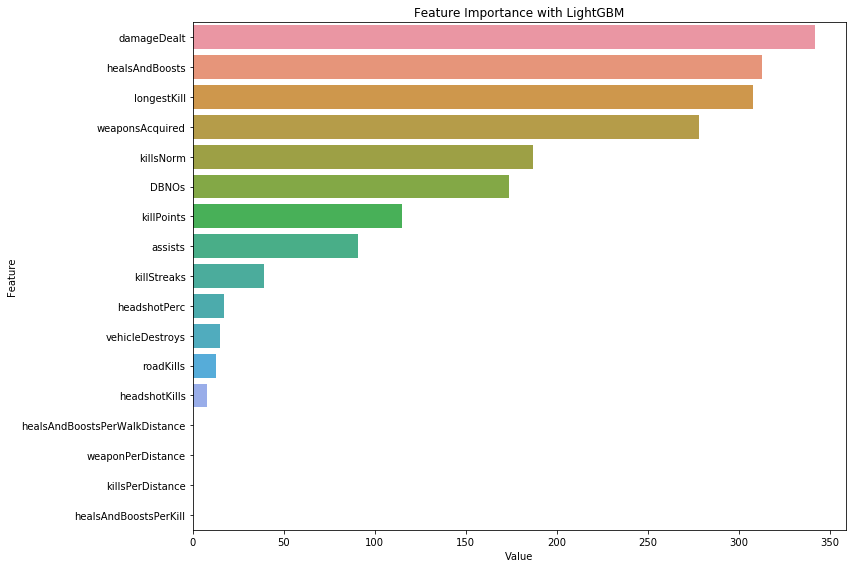

In [ ]:
#feature importance using light GBM
target = 'winPlacePerc'
cols_to_drop = ['Id', 'groupId', 'matchId', 'matchType', target, 'killPlace','walkDistance','numJoined','teamNum',
               'matchDuration','kills','maxPlace','winPoints','boosts','heals','rideDistance','swimDistance',
               'rankPoints','revives','teamKills','numGroups','totalDistance']
cols_to_fit = [col for col in df.columns if col not in cols_to_drop]
train, val = train_test_split(df, 0.3)

params = {
    'n_estimators': 100,
    'learning_rate': 0.3,
    'num_leaves': 20,
    'objective': 'regression_l2',
    'metric': 'mae',
    'verbose': -1,
}

model = LGBMRegressor(**params)
model.fit(
    train[cols_to_fit], train[target],
    eval_set=[(val[cols_to_fit], val[target])],
    eval_metric='mae',
    verbose=-1,
)

feature_importance = pd.DataFrame(sorted(zip(model.feature_importances_, cols_to_fit)), columns=['Value','Feature'])

plt.figure(figsize=(12, 8))
sns.barplot(x="Value", y="Feature", data=feature_importance.sort_values(by="Value", ascending=False))
plt.title('Feature Importance with LightGBM')
plt.tight_layout()

# What are some important features to assess cheaters?

### - Normalized Kills (Identify cheaters)


## <font color=darkcyan>Kills -- Massacre?</font>

In [ ]:
random.seed(831)

data,test = train_test_split(df,0.99)
data = data[['killsNorm','winPlacePerc']]
data['killsNorm'] = data['killsNorm'].astype('int')
N = 30
c = ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0, 360, N)]
kill_num = list(set(data['killsNorm']))
graph_data = [{
    'y': data['winPlacePerc'].loc[data['killsNorm']==kill_num[i]],
    'name':kill_num[i],
    'type':'box',
    'marker':{'color': c[i]}
} for i in range(len(kill_num))]

layout = {'xaxis': {'showgrid':True,'zeroline':False, 'tickangle':60,'showticklabels':True,'title':'Number of Kills'},
          'yaxis': {'zeroline':False,'gridcolor':'white','title':'Rank Percentile'},
          #'paper_bgcolor': 'rgb(233,233,233)',
          #'plot_bgcolor': 'rgb(233,233,233)',
          'title': 'Kills vs. Final Rank Percentile'
          }
init_notebook_mode(connected=True)
fig = go.Figure(data=graph_data,layout=layout)
iplot(fig)

In [ ]:
non_killing_perc = round(len(df[df['killsNorm']==0])/len(df) * 100,2)
two_killing_perc = round(len(df[df['killsNorm']<=2])/len(df) * 100,2)
max_kill = int(max(df['killsNorm']))
outlier_kill = outlier_range('killsNorm',99,df)

# print(non_killing_perc)
# print(two_killing_perc)
# print(max_kill)
# print(outlier_kill)

### 56.98% of players did not kill a single enemy!
### 78.22% of players killed less than 3 enemies.
### But...One player killed <font color=red>34</font> people in a game?! Sounds suspicious ummmm...
### So if one player killed more than 99% of other players do, we assume this individual could be possibly cheating.

## <font color=darkcyan>Incredible Head Shooters?</font>

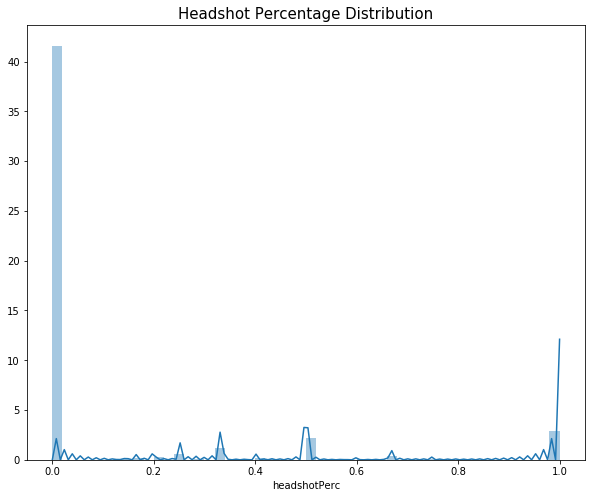

In [ ]:
show_distplot('headshotPerc','Headshot Percentage Distribution')

In [ ]:
max_headshot = df['kills'][df['headshotPerc']==1].max()
#print(max_headshot)

### Has 100% headshot rate shows you are a good player.
### Yet...killing 15 people all by headshots? Too good to be true! Could be cheaters.

##  <font color=darkcyan>Experienced Drivers or Cheaters?</font>

In [ ]:
df[['Id','roadKills','kills','winPlacePerc']].sort_values('roadKills').tail(3)

,Id,roadKills,kills,winPlacePerc
2767999,34193085975338,11,11,0.4713
2733926,c3e444f7d1289f,14,14,0.4286
2890740,a3438934e3e535,18,20,1.0000


In [ ]:
has_roadkill = round(100 - len(df[df['roadKills']==0])/len(df) * 100,2)
max_roadkill = int(max(df['roadKills']))

### Only 0.26% of players had crashed over enemies using vehicles.
### One player ran over <font color=red>18</font> enemies with his/her car!! This is insane!!
### Once again, if one player kills absurdly many enemies by car, we assume this individual could be a cheater.

##  <font color=darkcyan>Weapon Magnets?</font>

In [ ]:
hover_text,bubble_size = [], []
data,test = train_test_split(df,0.9999)
data['is_team'] = np.where(data['matchType'].isin(['solo','solo-fpp']),'solo',
                         np.where(data['matchType'].isin(['duo','duo-fpp']),'duo','squad'))
for index, row in data.iterrows():
    hover_text.append(('Match Type: {is_team}<br>'+
                      'Rank Percentile: {winPlacePerc}<br>'+
                      'Total Distance Traveled: {totalDistance}<br>'+
                      'Weapons Acquired: {weaponsAcquired}<br>').format(is_team=row['is_team'],
                                            winPlacePerc=row['winPlacePerc'],
                                            totalDistance=row['totalDistance'],
                                            weaponsAcquired=row['weaponsAcquired']))
    bubble_size.append(row['weaponsAcquired'] * 500)
data['text'] = hover_text
data['size'] = bubble_size
sizeref = data['weaponsAcquired'].max()

match_types = list(set(data['is_team']))
graph_data = list()

for match_type in match_types:
    trace = go.Scatter(
                x=data['totalDistance'][data['is_team'] == match_type],
                y=data['winPlacePerc'][data['is_team'] == match_type ],
                mode='markers',
                name=match_type,
                text=data['text'][data['is_team'] == match_type],
                marker=dict(
                    symbol='circle',
                    sizemode='area',
                    sizeref=sizeref,
                    size=data['size'][data['is_team'] == match_type],
                    line=dict(
                        width=2
                    ),
                )
            )
    graph_data.append(trace)

layout = go.Layout(
    title='Rank Percentile based on Weapons acquired per Distance',
    xaxis=dict(
        title='Total Distance Traveled',
        gridcolor='rgb(255, 255, 255)',
        range=[0, max(data['totalDistance'])],
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Rank Percentile',
        gridcolor='rgb(255, 255, 255)',
        range=[0, 1.05],
        zerolinewidth=1,
        ticklen=5,
        gridwidth=2,
    ),
)

fig = go.Figure(data=graph_data, layout=layout)
iplot(fig)

In [ ]:
outlier_weapon = round(len(df[(df['weaponsAcquired'] > 10) & (df['totalDistance'] == 0)])/len(df) * 100,2)
max_weapon = df[df['totalDistance']==0]['weaponsAcquired'].max()

# print(outlier_weapon)
# print(max_weapon)

### Typically, you wander around to gather weapons.
### Yet, 0.01% of players collect more than 10 weapons without moving. Interesting...
### One player acquired <font color=red>52</font> weapons without moving a single meter!
### We assume this kind of "Weapon Magnets" to be cheaters.

## <font color=darkcyan>Deadpools?</font>

In [ ]:
hover_text = []
data,test = train_test_split(df,0.99)
for index, row in data.iterrows():
    hover_text.append(('Number of Kills: {killsNorm}<br>'+
                      'Heals and Boosts: {healsAndBoosts}<br>'+
                      'Rank Percentile: {winPlacePerc}<br>').format(killsNorm=row['killsNorm'],
                                            healsAndBoosts=row['healsAndBoosts'],
                                            winPlacePerc=row['winPlacePerc']))
data['text'] = hover_text
trace1 = go.Scatter3d(
    x=data['killsNorm'],
    y=data['healsAndBoosts'],
    z=data['winPlacePerc'],
    mode='markers',
    text = data['text'],
    marker=dict(
        size=5,
        color = 'pink',
        line = dict(color='lightblue', width = 0.5),
        colorscale='Jet',
        opacity=0.8
    )
)
graph_data = [trace1]
layout = go.Layout(
    title='Number of Kills v. Medical Supplies v. Rank Percentile',
    autosize=False,
    scene=go.Scene(
        xaxis=go.XAxis(title='Number of Kills'),
        yaxis=go.YAxis(title='Heals and Boosts'),
        zaxis=go.ZAxis(title='Rank Percentile')),
     margin=dict(
        l=65,
        r=50,
        b=65,
        t=90
    )
)

fig = go.Figure(data=graph_data, layout=layout)
iplot(fig)

### Not using medical supplies is normal,
### But...Killing over <font color=red>10</font> people without healing, are they deadpools or cheaters??

In [ ]:
df[['healsAndBoosts','kills','winPlacePerc']][df['healsAndBoosts']==0].sort_values('kills').tail(3)

,healsAndBoosts,kills,winPlacePerc
652889,0,16,1.0
2033134,0,17,1.0
3517965,0,17,1.0


In [ ]:
#subset the data from 4 million to 0.1 million to save computation time
#use the above assumptions to find out the cheaters in this 0.1 million data
data_sub,try_ = train_test_split(df,0.977)

id_set = set()
id_set.update(data_sub['Id'].loc[data_sub['killsNorm'] >= np.percentile(data_sub['killsNorm'],99)])
id_set.update(data_sub[data_sub['roadKills']>=int(outlier_range('roadKills',99.9,data_sub))]['Id'])
id_set.update(data_sub[(data_sub['weaponsAcquired'] > outlier_range('weaponsAcquired',99,data_sub)) & (data_sub['totalDistance'] == 0)]['Id'])
id_set.update(data_sub[(data_sub['headshotPerc']==1)&(data_sub['killsNorm']>outlier_range('killsNorm',99,data_sub))]['Id'])
id_set.update(data_sub[(data_sub['healsAndBoosts']==0)&(data_sub['killsNorm'] > outlier_range('killsNorm',99,data_sub))]['Id'])

In [ ]:
outlier_len = len(set(id_set))
#print(outlier_len)

### According to our assumptions above, we found <font color=red>1329</font> potential cheaters out of 0.1 million players.
### Is there any faster way to catch cheaters? Yes!

# Machine Learning: Anomaly Detection

## <font color=darkcyan>One-Class Support Vector Machine (OCSVM)</font>

In [ ]:
#data preparation
data = data_sub[['roadKills','killsNorm','weaponPerDistance','healsAndBoostsPerKill','headshotPerc']]
min_max_scaler = preprocessing.StandardScaler()
np_scaled = min_max_scaler.fit_transform(data)
data = pd.DataFrame(np_scaled)

## PCA to speed-up ML algorithms

In [ ]:
# PCA to speed-up machine learning algorithms
pca = PCA(n_components=5)
pca_data = pca.fit_transform(data)
print(pca.explained_variance_ratio_) #every component explains a part of data

[0.3855168  0.2003042  0.18627083 0.12983489 0.09807328]


## Decide the proportion of cheaters in games

In [ ]:
outlier_lst = [0.01,0.05,0.1]

#find out proportion of cheaters in the games
for outliers_fraction in outlier_lst:
    model =  OneClassSVM(nu=0.95 * outliers_fraction,verbose=False)
    model.fit(data)
    data_sub['anomaly_svm'] = model.predict(data)
    data_sub['anomaly_svm'] = data_sub['anomaly_svm'].map({1: 0, -1: 1})

    cheater_id = data_sub['Id'].loc[data_sub['anomaly_svm']==1]
    precision = round(len(set(cheater_id) & id_set) / len(id_set) * 100,2)

    print(f'Assumption: There are {str(outliers_fraction*100)}% of cheaters in the games:')
    print('Count of cheaters: 0 - Normal players, 1 - Cheaters')
    print(data_sub['anomaly_svm'].value_counts())
    print(f"""{str(precision)}% of the {str(outlier_len)} player we identified as cheaters using above assumptions and data visualization methods
are also labeled as cheaters using the One-Class SVM model.\n""")

Assumption: There are 1.0% of cheaters in the games:
Count of cheaters: 0 - Normal players, 1 - Cheaters
0    95104
1     6776
Name: anomaly_svm, dtype: int64
29.65% of the 1329 player we identified as cheaters using above assumptions and data visualization methods 
are also labeled as cheaters using the One-Class SVM model.

Assumption: There are 5.0% of cheaters in the games:
Count of cheaters: 0 - Normal players, 1 - Cheaters
0    91019
1    10861
Name: anomaly_svm, dtype: int64
77.58% of the 1329 player we identified as cheaters using above assumptions and data visualization methods 
are also labeled as cheaters using the One-Class SVM model.

Assumption: There are 10.0% of cheaters in the games:
Count of cheaters: 0 - Normal players, 1 - Cheaters
0    88087
1    13793
Name: anomaly_svm, dtype: int64
98.87% of the 1329 player we identified as cheaters using above assumptions and data visualization methods 
are also labeled as cheaters using the One-Class SVM model.



## Cross Validating the model:

### When cheater proportion is 10%,  <font color=red>98.87%</font> of the 1329 players we identified as cheaters using above
### assumptions and data visualization methods are also labeled as cheaters using the One-Class SVM model.
### <font color=orange>10% is a good estimation of proportion of cheaters in Game, and the model is actually identifying cheaters.</font>

## Try another method to cross validate... <font color=darkcyan>Isolation Forest</font>

In [ ]:
model =  IsolationForest(contamination = outliers_fraction)
model.fit(data)
# add the data to the main
data_sub['anomaly_if'] = model.predict(data)
data_sub['anomaly_if'] = data_sub['anomaly_if'].map( {1: 0, -1: 1} )
print(data_sub['anomaly_if'].value_counts())

0    91689
1    10191
Name: anomaly_if, dtype: int64


In [ ]:
cheater_id2 = data_sub['Id'].loc[data_sub['anomaly_if']==1]
precision2 = round(len(set(cheater_id2) & id_set) / len(id_set) * 100,2)
#print(precision2)

###  <font color=red>91.27%</font> of the 1329 players we identified as cheaters using above assumptions and data visualization methods
### are also labeled as cheaters, showing that Isolation Forest is also a good model to identify cheaters.

## Find the players identified by both models as cheaters

In [ ]:
overlap_len = len(set(data_sub['Id'].loc[data_sub['anomaly_if']==1]) & set(data_sub['Id'].loc[data_sub['anomaly_svm']==1]))
min_len = min(len(data_sub['Id'].loc[data_sub['anomaly_if']==1]),len(data_sub['Id'].loc[data_sub['anomaly_svm']==1]))
overlap_coeff = round(overlap_len/min_len *100,2)
# print(overlap_len)
# print(overlap_coeff)

### 6563 players are labeled as cheaters by both SVM and Isolation Forest model. The overlap coefficient is 64.39%.
### After cross validation, we are now confident that these 6563 players are more likely to be cheaters.